In [213]:
import pandas as pd
import matplotlib.pyplot as plt
from VAE_model_tablets import VAE
import torch
from era_data import TabletPeriodDataset, get_IDS
from tqdm.notebook import tqdm
from collections import Counter
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import math
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import seaborn as sns 

# Loading Encoding Dataframes

In [46]:
df_encodings_train = pd.read_csv('vae_encodings_and_data/vae_encoding_df_sept30_train.csv')

In [47]:
df_encodings_test = pd.read_csv('vae_encodings_and_data/vae_encoding_df_sept30_test.csv')

# Classification based on Periods and genres (separately) 

This will enable us to assess the effectiveness of the VAE encodings as predictors for the genre/period classification tasks, even though the VAE wasn't initially trained for this purpose. It will indicate whether our research approach is on the right track and if tablet shapes correlate with their respective creation periods.

## Train-test division

In [55]:
y_train_period = df_encodings_train['Period']
X_train_period = df_encodings_train.drop(['Period', 'Genre', 'Period_Name','Genre_Name'], axis = 1)

y_train_genre = df_encodings_train['Genre']
X_train_genre = df_encodings_train.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name'], axis = 1)

y_test_period = df_encodings_test['Period']
X_test_period = df_encodings_test.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name'], axis = 1)

y_test_genre = df_encodings_test['Genre']
X_test_genre = df_encodings_test.drop(['Period', 'Period_Name', 'Genre', 'Genre_Name'], axis = 1)

## Period classifier
### Training a model based on the encoding

In [59]:
# Build a Gaussian Classifier
model_period = RandomForestClassifier()

# Model training
model_period.fit(X_train_period, y_train_period)

### Prediction 

In [ ]:
# Predict Output
preds_period = model_period.predict(X_test_period)

#### Adding Eras to the prediction labels

In [27]:
def explain(period):
    return f'{period} ({ERA_MAP.get(period, "?")})'

In [26]:
EARLY_BRONZE = {
    'Old Akkadian', 'Ur III',
    'ED IIIb', 'Uruk III',
    'Proto-Elamite', 'Lagash II',
    'Ebla', 'ED IIIa', 'ED I-II',
    'Uruk IV', 'Linear Elamite',
    'Harappan'
    
}
MID_LATE_BRONZE = {
    'Early Old Babylonian',
    'Old Babylonian', 'Old Assyrian',
    'Middle Babylonian', 'Middle Assyrian',
    'Middle Elamite', 'Middle Hittite'
}
IRON = {
    'Neo-Babylonian', 'Neo-Assyrian',
    'Achaemenid', 'Hellenistic',
    'Neo-Elamite'
}
ERA_MAP = {
    **{K: 'EB' for K in EARLY_BRONZE},
    **{K: 'MLB' for K in MID_LATE_BRONZE},
    **{K: 'I' for K in IRON},
}

In [28]:
idx2period = {v: k for k, v in TabletPeriodDataset.PERIOD_INDICES.items()}
idx2period[0] = 'other'

In [67]:
indices_period = list(set(y_test_period) | set(preds_period))
PERIOD_LABELS = [explain(idx2period[i]) for i in indices_period]

In [68]:
print(classification_report(y_test_period, preds_period, zero_division=0, target_names=PERIOD_LABELS))

                            precision    recall  f1-score   support

                 other (?)       0.00      0.00      0.00         3
               Ur III (EB)       0.66      0.82      0.73       140
          Neo-Assyrian (I)       0.80      0.94      0.86       109
      Old Babylonian (MLB)       0.44      0.67      0.53        91
   Middle Babylonian (MLB)       0.70      0.20      0.31        35
        Neo-Babylonian (I)       0.50      0.35      0.41        23
         Old Akkadian (EB)       0.75      0.17      0.27        18
            Achaemenid (I)       0.80      0.40      0.53        10
Early Old Babylonian (MLB)       0.67      0.22      0.33         9
              ED IIIb (EB)       1.00      0.13      0.24        15
     Middle Assyrian (MLB)       0.00      0.00      0.00         8
        Old Assyrian (MLB)       0.67      0.17      0.27        12
             Uruk III (EB)       1.00      0.20      0.33         5
            Lagash II (EB)       0.50      0.20

#### Repeating the analysis using classes with support >=10, everything else goes to 0: other

In [71]:
COMMON_LABELS_PERIOD = list({k for k, v in Counter(y_test_period).items() if v >= 10})
print(f'Common period labels: ({len(COMMON_LABELS_PERIOD)})')

Common period labels: (9)


In [76]:
y_true_period_c = y_test_period.copy()
y_true_period_c[~np.isin(y_test_period, COMMON_LABELS_PERIOD)] = 0
print(round((~np.isin(y_test_period, COMMON_LABELS_PERIOD)).mean(), 2), 'changed to "other"')

0.07 changed to "other"


In [77]:
preds_period_c = preds_period.copy()
preds_period_c[~np.isin(preds_period, COMMON_LABELS_PERIOD)] = 0
print(round((~np.isin(preds_period, COMMON_LABELS_PERIOD)).mean(), 2), 'changed to "other"')

0.02 changed to "other"


In [78]:
indices_period_c = list(set(y_true_period_c) | set(preds_period_c))
PERIOD_LABELS_C = [explain(idx2period[i]) for i in indices_period_c]

In [82]:
print(classification_report(y_true_period_c, preds_period_c, target_names=PERIOD_LABELS_C))

                         precision    recall  f1-score   support

              other (?)       0.88      0.19      0.32        36
            Ur III (EB)       0.66      0.82      0.73       140
       Neo-Assyrian (I)       0.80      0.94      0.86       109
   Old Babylonian (MLB)       0.44      0.67      0.53        91
Middle Babylonian (MLB)       0.70      0.20      0.31        35
     Neo-Babylonian (I)       0.50      0.35      0.41        23
      Old Akkadian (EB)       0.75      0.17      0.27        18
         Achaemenid (I)       0.80      0.40      0.53        10
           ED IIIb (EB)       1.00      0.13      0.24        15
     Old Assyrian (MLB)       0.67      0.17      0.27        12

               accuracy                           0.64       489
              macro avg       0.72      0.40      0.45       489
           weighted avg       0.68      0.64      0.60       489



## Genre classifier
### Training a model based on the encoding

In [84]:
# Build a Gaussian Classifier
model_genre = RandomForestClassifier()

# Model training
model_genre.fit(X_train_genre, y_train_genre)

RandomForestClassifier()

### Prediction

In [85]:
# Predict Output
preds_genre = model_genre.predict(X_test_genre)

In [91]:
GENRE_INDICES = {
        
        1: 'Administrative',
        2: 'Letter',
        3: 'Legal',
        4: 'Royal/Monumental',
        5: 'Literary',
        6: 'Lexical',
        7: 'Omen',
        8: 'uncertain',
        9: 'School',
        10: 'Mathematical',
        11: 'Prayer/Incantation',
        12: 'Scientific',
        13: 'Ritual',
        14: 'fake (modern)',
        15: 'Astronomical',
        16: 'Private/Votive',
    }

In [92]:
indices_genre = list(set(y_test_genre) | set(preds_genre))
GENRE_LABELS = [GENRE_INDICES[i] for i in indices_genre]

In [93]:
print(classification_report(y_test_genre, preds_genre, target_names=GENRE_LABELS))

                    precision    recall  f1-score   support

    Administrative       0.70      0.94      0.80       245
            Letter       0.67      0.22      0.33        37
             Legal       0.29      0.11      0.15        19
  Royal/Monumental       0.75      0.50      0.60        24
          Literary       0.00      0.00      0.00        22
           Lexical       0.00      0.00      0.00        18
              Omen       0.00      0.00      0.00         9
         uncertain       0.61      0.70      0.65       104
            School       0.00      0.00      0.00         3
      Mathematical       0.00      0.00      0.00         4
Prayer/Incantation       0.00      0.00      0.00         1
        Scientific       0.00      0.00      0.00         2
    Private/Votive       0.00      0.00      0.00         1

          accuracy                           0.66       489
         macro avg       0.23      0.19      0.20       489
      weighted avg       0.58      0.6

/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, le

### Repeating the analysis using classes with support >=10, everything else goes to 8: uncertain

In [94]:
COMMON_LABELS_GENRE = list({k for k, v in Counter(y_test_genre).items() if v >= 10})
print(f'Common period labels: ({len(COMMON_LABELS_GENRE)})')

Common period labels: (7)


In [104]:
y_pred_genre_c = preds_genre.copy()
y_pred_genre_c[~np.isin(preds_genre, COMMON_LABELS_GENRE)] = 8
print(round((~np.isin(preds_genre, COMMON_LABELS_GENRE)).mean(), 3), 'changed to "uncertain"')

0.004 changed to "uncertain"


In [99]:
y_true_genre_c = y_test_genre.copy()
y_true_genre_c[~np.isin(y_test_genre, COMMON_LABELS_GENRE)] = 8
print(round((~np.isin(y_test_genre, COMMON_LABELS_GENRE)).mean(), 3), 'changed to "uncertain"')

0.041 changed to "uncertain"


In [122]:
indices_genre_c = list(set(y_true_genre_c) | set(y_pred_genre_c))
GENRE_LABELS_C = [GENRE_INDICES[i] for i in indices_genre_c]

In [124]:
print(classification_report(y_true_genre_c.values, y_pred_genre_c, target_names=GENRE_LABELS_C))

                  precision    recall  f1-score   support

  Administrative       0.70      0.94      0.80       245
          Letter       0.67      0.22      0.33        37
           Legal       0.29      0.11      0.15        19
Royal/Monumental       0.75      0.50      0.60        24
        Literary       0.00      0.00      0.00        22
         Lexical       0.00      0.00      0.00        18
       uncertain       0.71      0.70      0.71       124

        accuracy                           0.69       489
       macro avg       0.45      0.35      0.37       489
    weighted avg       0.63      0.69      0.64       489



# Analysis - Per class mean

This analysis allows us to examine the average representation of tablets within each class (period/genre) and delve into the distinctions within each genre/period. This will shed light on whether the VAE model successfully identified shapes in a manner that differentiates between the various classes, without it being trained on a supervised task.

## Loading model

In [131]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# IMG_DIR = 'output/images'
RUN_NAME_SUFFIX = '-masked' # ''
IMG_DIR = 'output/images_preprocessed'
LR = 5e-5
EPOCHS = 50
BATCH_SIZE = 16
SUFFIX = '-resnet50'
IDS = get_IDS(IMG_DIR=IMG_DIR)
len(IDS)

VERSION_NAME = f'period_clf_bs{BATCH_SIZE}_lr{LR}_{EPOCHS}epochs{SUFFIX}-{len(IDS)}_samples{RUN_NAME_SUFFIX}_blurvae-conv-Sept20'
chekpoint_path = f'lightning_logs/{VERSION_NAME}/checkpoints/epoch=39-step=535208.ckpt'
vae_model = VAE.load_from_checkpoint(chekpoint_path,image_channels=1,z_dim=16, lr =1e-5 )

## Mean tablet representation, per genre:

In [210]:
def generate_mean_tablet_plot(df, column_name='Genre_Name', model_resume=None):
    """
    Generates a plot for the given DataFrame based on the specified column_name.

    Parameters:
    - df: DataFrame containing the data
    - column_name: Column to use for divisions ('Genre_Name' or 'Period_Name')
    - model_resume: Model to use for generating images
    """
    # Define the grid dimensions
    num_cols = 6
    unique_classes = df[column_name].unique()
    num_classes = len(unique_classes)
    num_rows = math.ceil(num_classes / num_cols)

    plt.figure(figsize=(18, num_rows * 2.5))  # Adjust the vertical size based on the number of rows

    for i, class_name in enumerate(unique_classes):
        class_subset = df[df[column_name] == class_name]
        num_samples = len(class_subset)
        
        class_mean = class_subset.drop(['Genre', 'Genre_Name', 'Period', 'Period_Name'], axis=1).mean().values.astype('float32')
        new_tab_long = model_resume.fc3(torch.from_numpy(class_mean).unsqueeze(0))

        with torch.no_grad():
            generated_image = model_resume.decoder(new_tab_long)

        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(generated_image[0][0], cmap='gray')
        plt.axis('off')  # Turn off the axes for cleaner display
        plt.title(f"{class_name} (n={num_samples})")

    plt.suptitle(f"Mean tablet by {column_name}", fontsize=20, fontweight='bold')

    plt.tight_layout()  # Adjust the spacing between subplots
    plt.show()

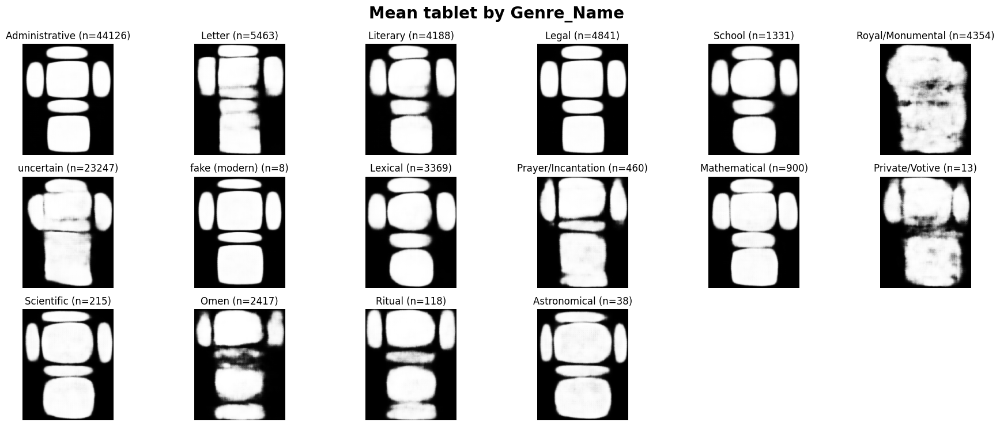

In [211]:
generate_mean_tablet_plot(df_encodings_train, column_name='Genre_Name', model_resume=vae_model)

## Mean tablet representation, per period:

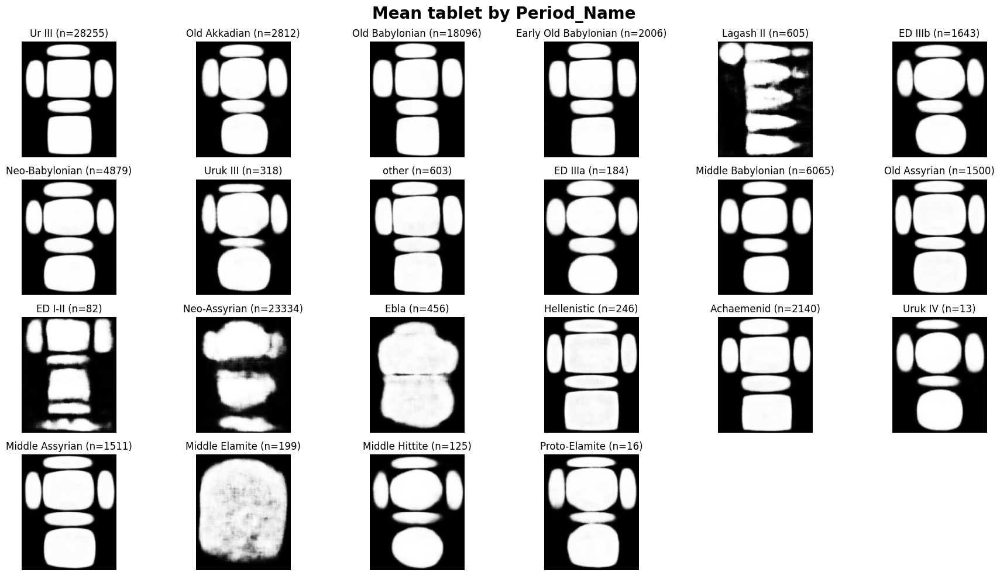

In [212]:
generate_mean_tablet_plot(df_encodings_train, column_name='Period_Name', model_resume=vae_model)

## Mean tablet representation, per period, per genre

In [201]:
import matplotlib.pyplot as plt
import torch
import pandas as pd

def generate_mean_tablet_plot_per_sec(df: pd.DataFrame, model, primary_col = None, secondary_col = None):
    """
    Visualize generated images based on the provided dataframe's primary and secondary columns.
    
    :param df: DataFrame containing encoding train data
    :param model: PyTorch model to use for generating images
    :param primary_col: Primary column for looping (e.g., 'Period_Name')
    :param secondary_col: Secondary column for looping (e.g., 'Genre_Name')
    """
    
    # Extract unique values from the primary column
    primary_values = df[primary_col].unique()
    
    for primary_value in primary_values:
        plt.figure(figsize=(12, 8))
        
        # Add the title for the current primary value in bold
        plt.suptitle(primary_value, fontsize=14, fontweight='bold')

        secondary_values = df[df[primary_col] == primary_value][secondary_col].unique()
        num_plots = len(secondary_values)
        
        # Define subplot layout
        num_rows = 4
        num_cols = 6
        
        for i, secondary_value in enumerate(secondary_values):
            filtered_df = df[(df[secondary_col] == secondary_value) & (df[primary_col] == primary_value)].drop(['Genre', 'Period'], axis=1)
            period_mean = filtered_df.drop([primary_col, secondary_col], axis=1).mean().values
        
            new_tab_long = model.fc3(torch.from_numpy(period_mean.astype('float32')).unsqueeze(0))
            
            with torch.no_grad():
                generated_image = model.decoder(new_tab_long)
            
            try:
                secondary_samples = len(filtered_df)
                primary_samples = len(df[df[primary_col] == primary_value])
                percentage = (secondary_samples / primary_samples) * 100
            except ZeroDivisionError:
                percentage = 0

            plt.subplot(num_rows, num_cols, i + 1)
            plt.imshow(generated_image[0][0], cmap='gray')  # specify cmap if it's a grayscale image
            plt.axis('off')
            
            title = f'{secondary_value}\n{percentage:.2f}%, ({secondary_samples} samples)'
            plt.title(title)
        
        plt.tight_layout()
        plt.show()

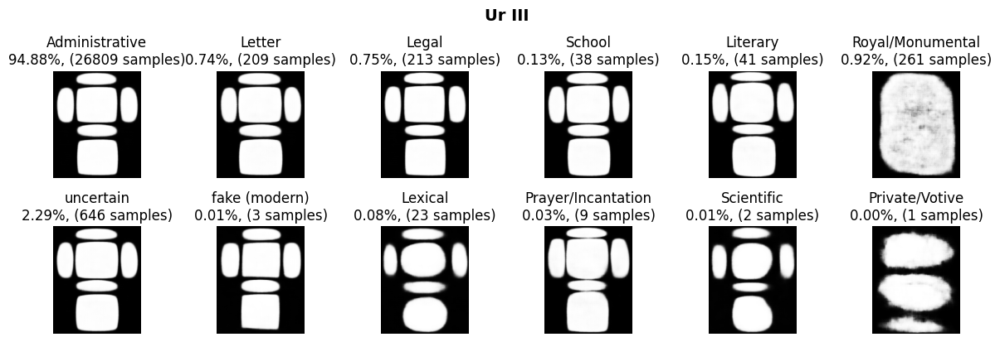

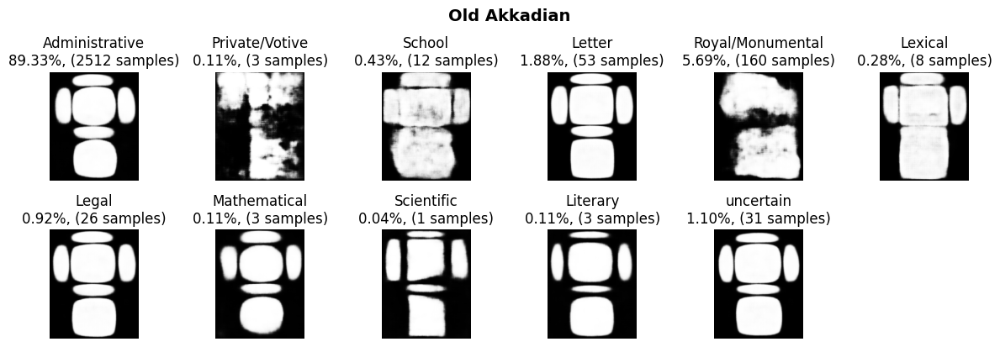

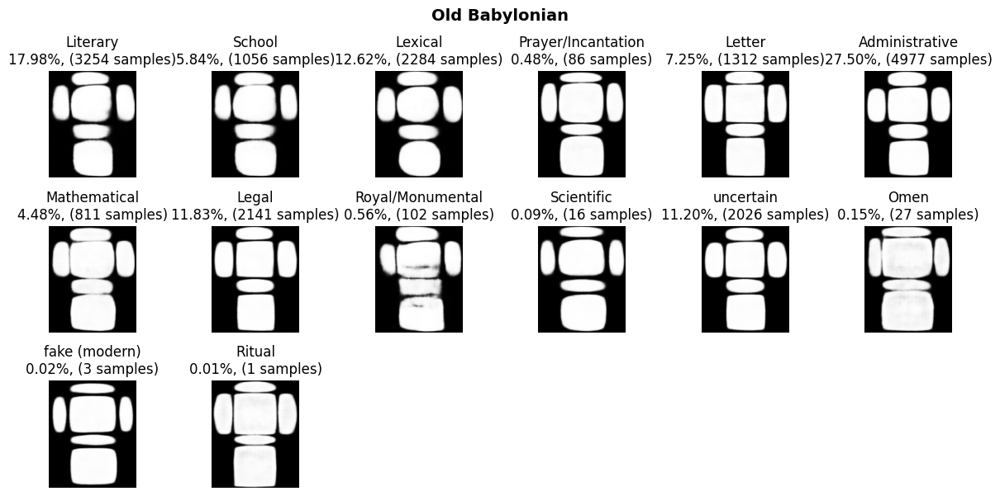

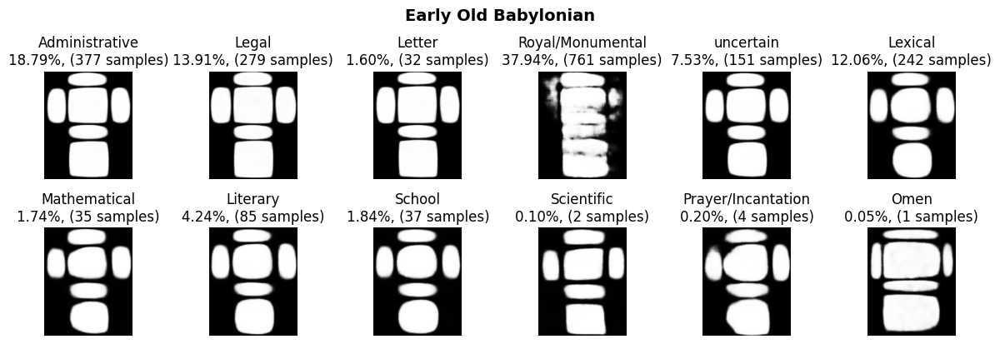

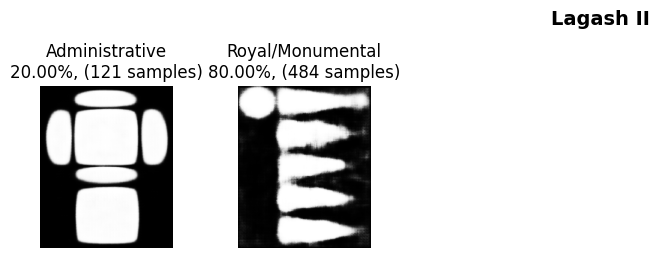

...

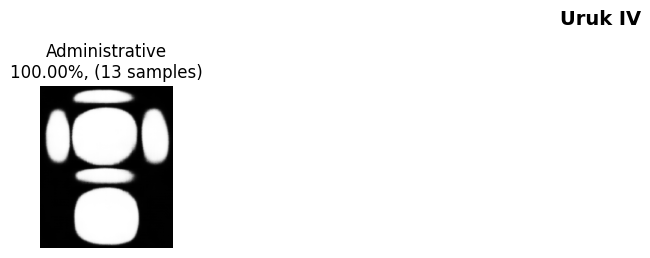

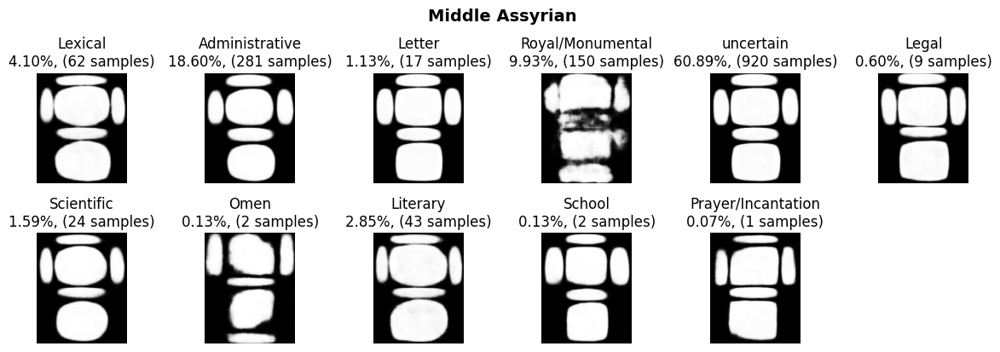

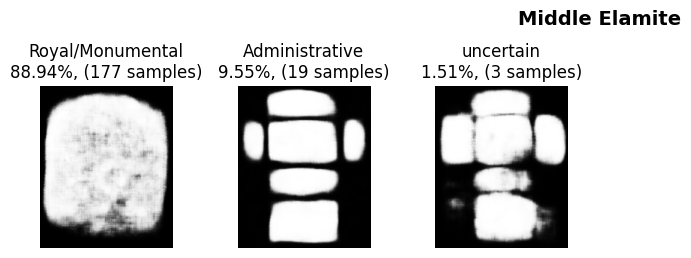

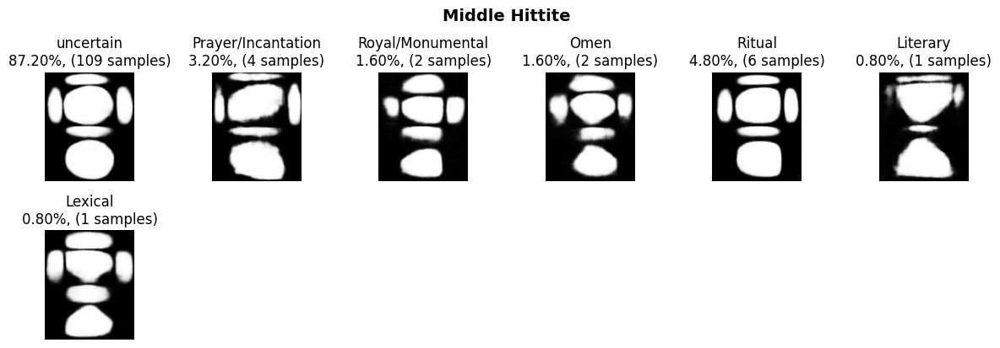

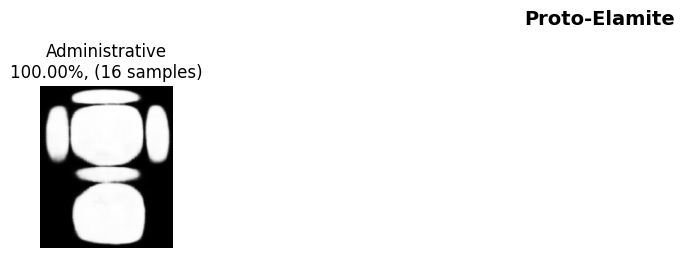

In [202]:
generate_mean_tablet_plot_per_sec(df_encodings_train, primary_col='Period_Name', secondary_col='Genre_Name', model=vae_model)

## Mean tablet representation, per genre, per period:

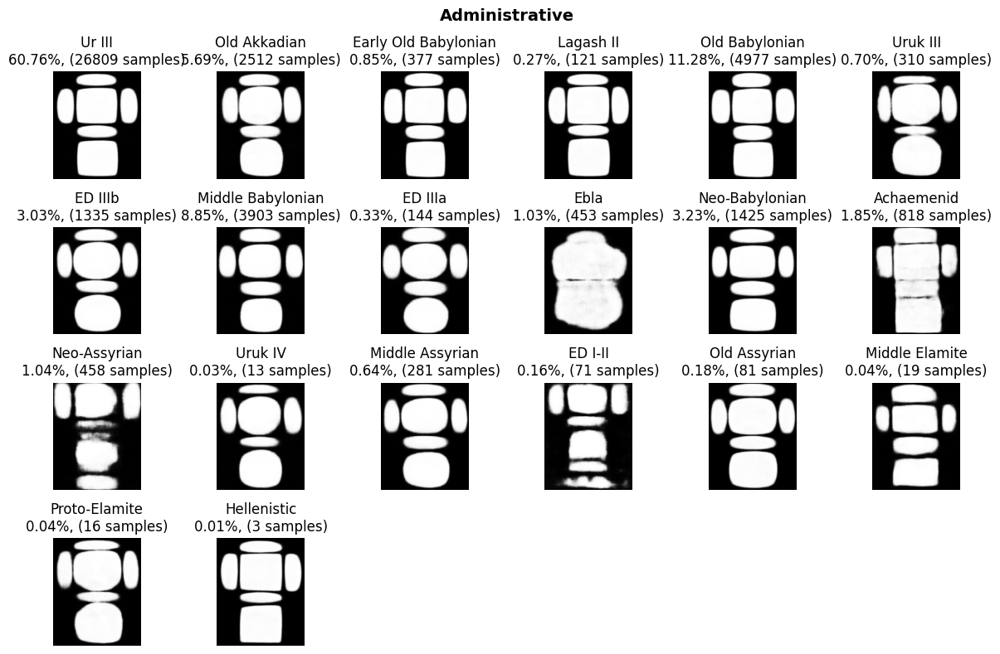

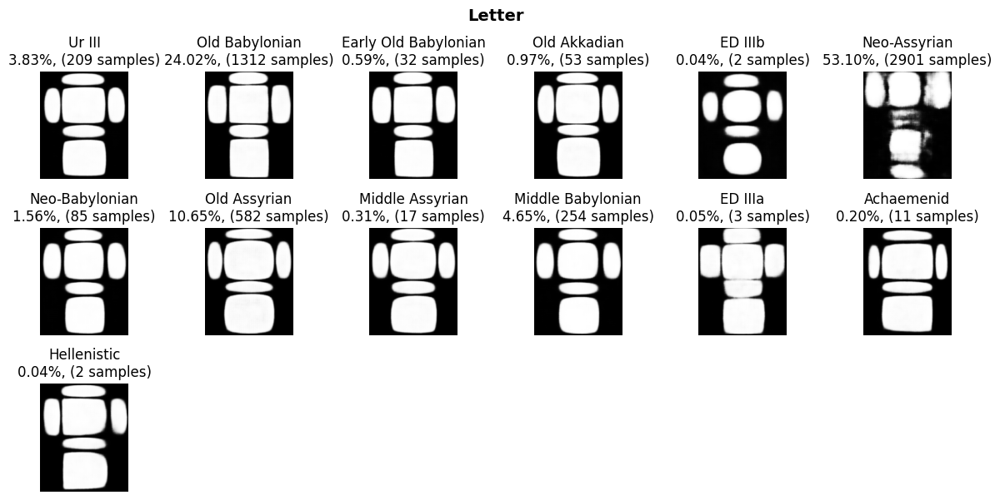

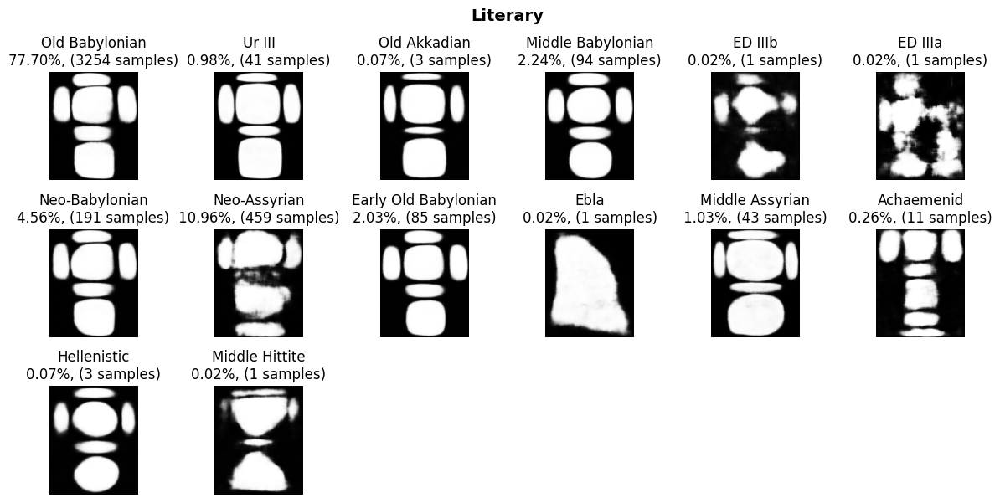

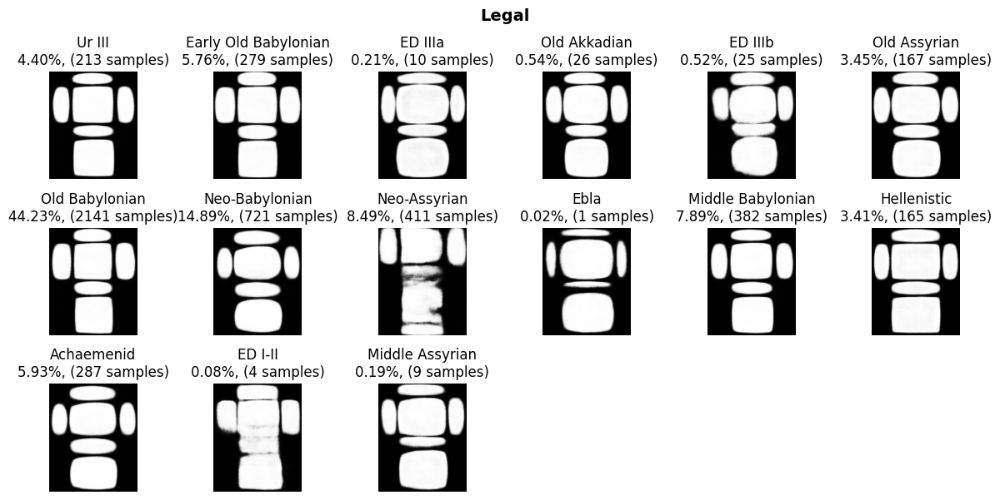

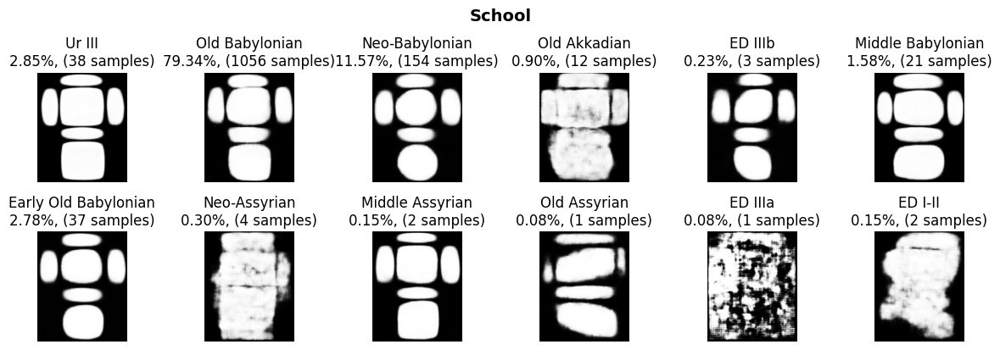

...

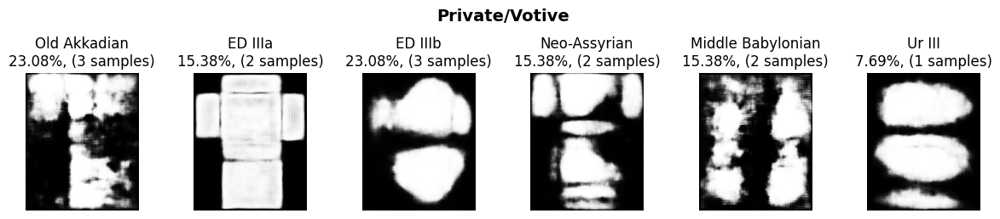

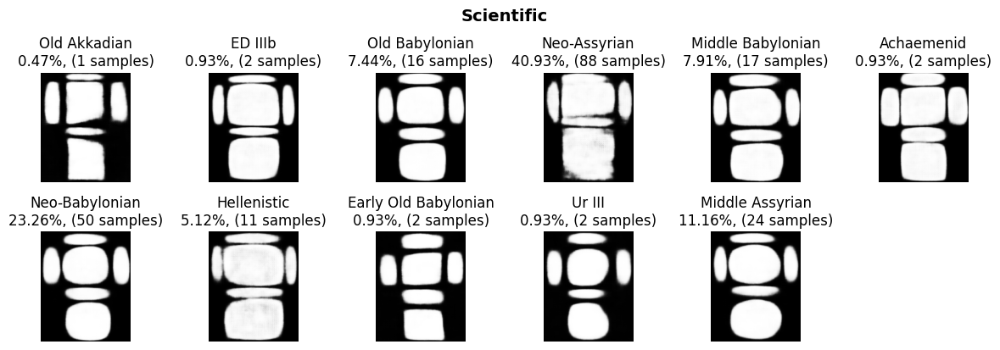

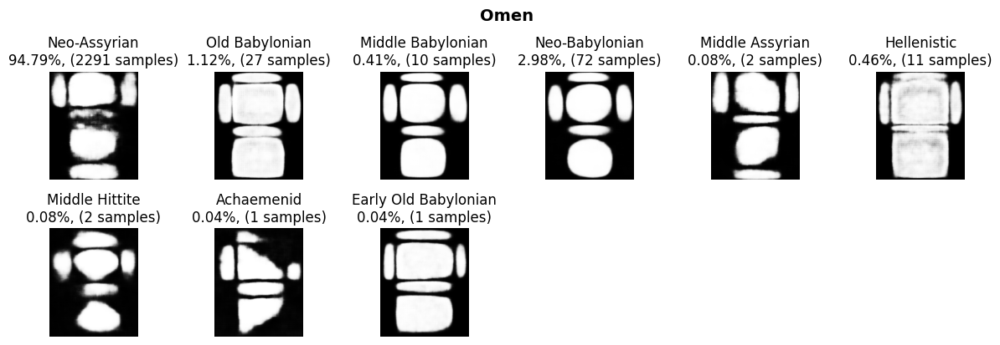

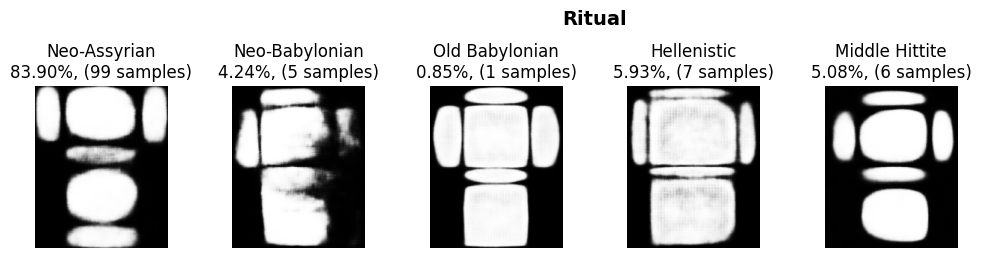

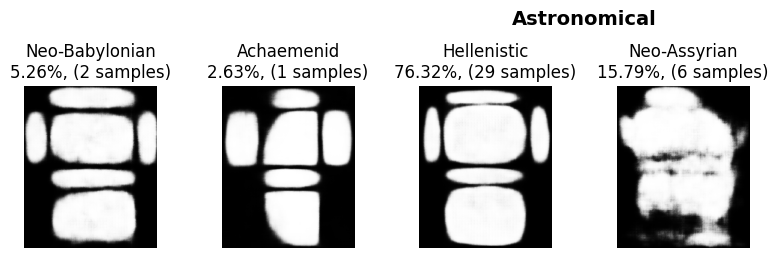

In [203]:
generate_mean_tablet_plot_per_sec(df_encodings_train, primary_col='Genre_Name', secondary_col='Period_Name', model=vae_model)

# LDA analysis of the encodings

By this analysis, we can see how the encodings cluster, and try to explain the meaning of the cluster division. We could also see how predictive these clusters are of the classes (periods / genres)

### Period LDA

In [215]:
lda_period = LinearDiscriminantAnalysis()
components_period = lda_period.fit_transform(X_train_period, y_train_period)

/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a 

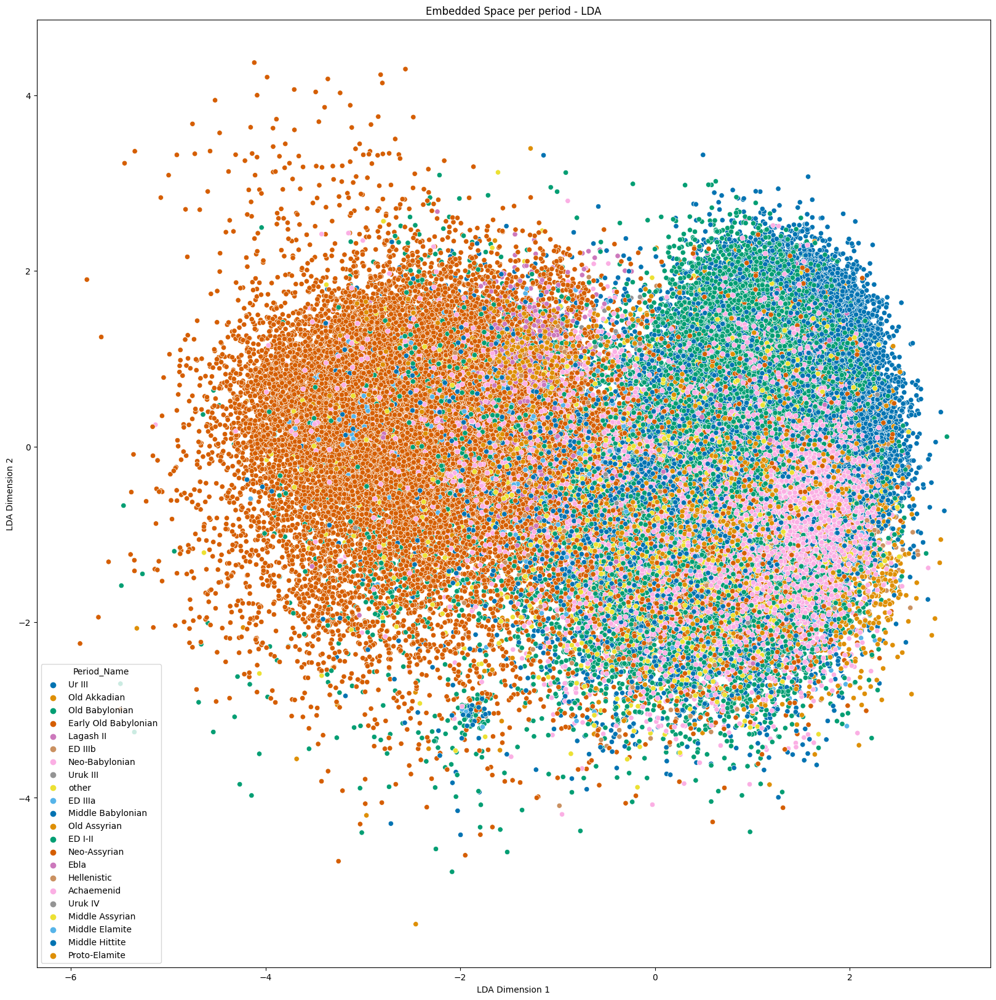

In [218]:
plt.figure(figsize=(20, 20))
sns.scatterplot(x=components_period[:, 0], y=components_period[:, 1], hue=df_encodings_train['Period_Name'], palette='colorblind')
plt.xlabel('LDA Dimension 1')
plt.ylabel('LDA Dimension 2')
plt.title('Embedded Space per period - LDA')
plt.show()

### Genre LDA

In [219]:
lda_genre = LinearDiscriminantAnalysis()
components_genre = lda_genre.fit_transform(X_train_genre, y_train_genre)

/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/kapond/.conda/envs/dani_torch/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a 

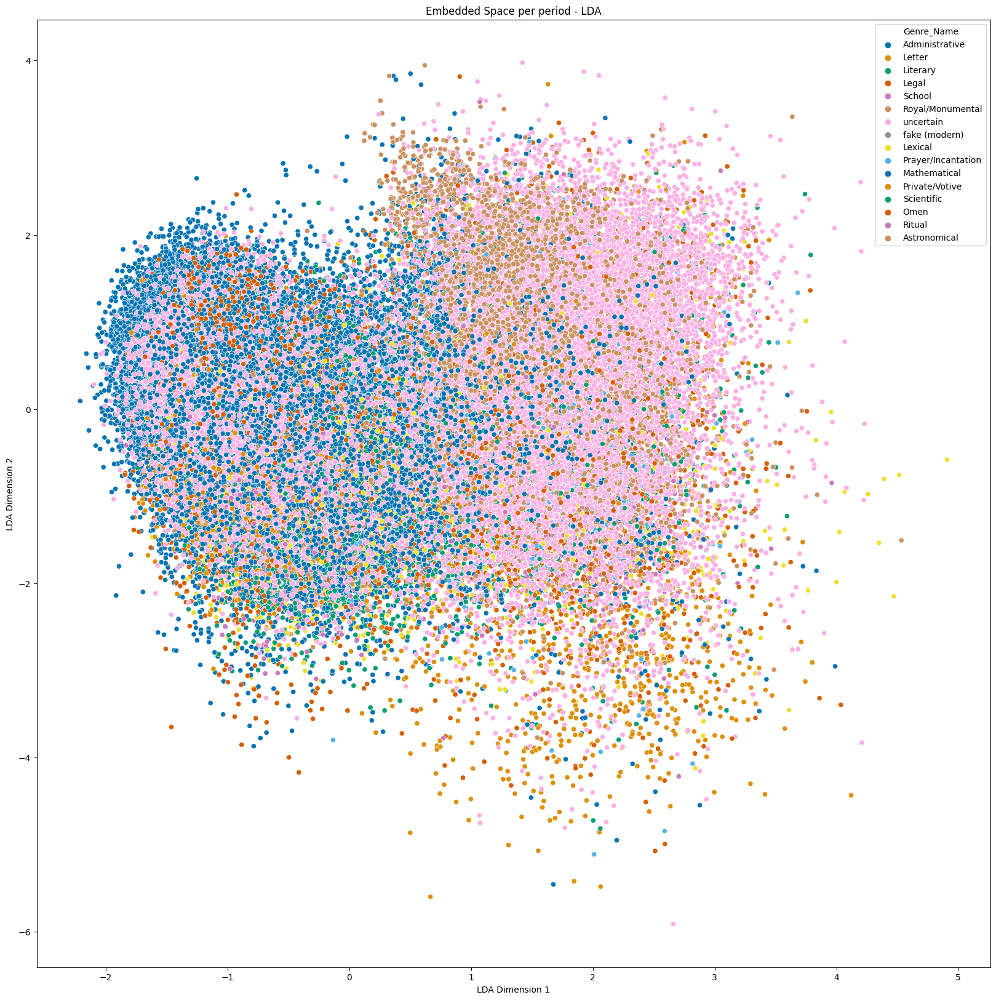

In [220]:
plt.figure(figsize=(20, 20))
sns.scatterplot(x=components_genre[:, 0], y=components_genre[:, 1], hue=df_encodings_train['Genre_Name'], palette='colorblind')
plt.xlabel('LDA Dimension 1')
plt.ylabel('LDA Dimension 2')
plt.title('Embedded Space per period - LDA')
plt.show()

# Code to make a GIF, passing through the encodings of tw periods

In [ ]:
# # Create a list to store generated images
# generated_images = []
# vae_model.eval()
# image1 = torch.from_numpy(np.array(Image.fromarray(ds_train[15340][0]).resize((178, 218), Image.NEAREST))).unsqueeze(0)  # Old Babylonian
# image2 = torch.from_numpy(np.array(Image.fromarray(ds_train[3500][0]).resize((178, 218), Image.NEAREST))).unsqueeze(0)  # Middle Babylonian
# with torch.no_grad():
#     latent_vector1 = model_resume.representation(image1.unsqueeze(0))
#     latent_vector2 = model_resume.representation(image2.unsqueeze(0))

# for i in [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]:
#     new_tablet = i * latent_vector1 + (1 - i) * latent_vector2
#     new_tab_long = model_resume.fc3(new_tablet)
#     with torch.no_grad():
#         generated_image = model_resume.decoder(new_tab_long)
#     generated_image = generated_image[0][0].detach().cpu().numpy()  # Assuming generated image is in channel-last format (C, H, W)
#     generated_images.append((generated_image * 255).astype('uint8'))  # Convert image to uint8 and scale to 0-255

# # Save the generated images as GIF
# imageio.mimsave('generated_images.gif', generated_images, duration=0.5)